In [ ]:
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="BYeHkeZIrf9VaHXpKp3Y")
project = rf.workspace("imit-h5ows").project("soil-detection-l0ngo")
version = project.version(3)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 33.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 42.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Soil-detection-3 in yolov8:: 100%|██████████| 582/582 [00:00<00:00, 3323.91it/s]


In [ ]:
import os
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import albumentations as A
from tqdm import tqdm
from sentence_transformers import SentenceTransformer
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# ---------------------------------------
# 1️⃣ Paths
# ---------------------------------------
SOIL_DATASET = "/content/Soil-detection-3/train/images"
OUTPUT_DIR = "/content/processed"

AUGMENTED_DIR = os.path.join(OUTPUT_DIR, "augmented")
ENCODING_DIR = os.path.join(OUTPUT_DIR, "encodings")

os.makedirs(AUGMENTED_DIR, exist_ok=True)
os.makedirs(ENCODING_DIR, exist_ok=True)

print("Paths created successfully!")
print("Dataset exists:", os.path.exists(SOIL_DATASET))
print("Images found:", len(os.listdir(SOIL_DATASET)))


# ---------------------------------------
# 2️⃣ Augmentation Pipeline
# ---------------------------------------
augmentor = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomBrightnessContrast(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.GaussianBlur(p=0.3),
])


# ---------------------------------------
# 3️⃣ Apply Augmentation
# ---------------------------------------
def augment_images():
    images = os.listdir(SOIL_DATASET)
    if not images:
        print(" No images found in dataset.")
        return

    for img_name in tqdm(images, desc="Augmenting images"):
        img_path = os.path.join(SOIL_DATASET, img_name)
        img = cv2.imread(img_path)

        if img is None:
            print("Skipping unreadable image:", img_name)
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Apply augmentation
        augmented = augmentor(image=img_rgb)["image"]

        # Save augmented image
        save_path = os.path.join(AUGMENTED_DIR, img_name)
        cv2.imwrite(save_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

    print(" Augmentation Complete! Files saved in:", AUGMENTED_DIR)


# ---------------------------------------
# 4️⃣ Image Encoder (MobileNetV2)
# ---------------------------------------
encoder = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")

def encode_images():
    images = os.listdir(AUGMENTED_DIR)

    if not images:
        print(" No augmented images found. Run augmentation first.")
        return

    for img_name in tqdm(images, desc="Encoding images"):
        img_path = os.path.join(AUGMENTED_DIR, img_name)

        img = Image.open(img_path).convert("RGB").resize((224, 224))
        img = preprocess_input(np.array(img))
        img = np.expand_dims(img, axis=0)

        embedding = encoder.predict(img)

        # Save encoding
        np.save(os.path.join(ENCODING_DIR, img_name.replace(".jpg", ".npy")), embedding)

    print(" Encodings saved in:", ENCODING_DIR)


# ---------------------------------------
# 5️⃣ RUN THE FULL PIPELINE
# ---------------------------------------
augment_images()
encode_images()

# ---------------------------------------
# 6️⃣ Verify Output
# ---------------------------------------
print("\nFinal Verification:")
print("Augmented Images:", len(os.listdir(AUGMENTED_DIR)))
print("Encodings:", len(os.listdir(ENCODING_DIR)))


Paths created successfully!
Dataset exists: True
Images found: 199


`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Augmenting images: 100%|██████████| 199/199 [00:01<00:00, 101.88it/s]


 Augmentation Complete! Files saved in: /content/processed/augmented


Encoding images:   0%|          | 0/199 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


Encoding images:   1%|          | 1/199 [00:12<40:23, 12.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:   2%|▏         | 3/199 [00:12<10:33,  3.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:   3%|▎         | 5/199 [00:12<05:12,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Encoding images:   4%|▎         | 7/199 [00:12<03:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:   5%|▍         | 9/199 [00:12<01:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Encoding images:   6%|▌         | 11/199 [00:13<01:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Encoding images:   7%|▋         | 13/199 [00:13<00:58,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:   8%|▊         | 15/199 [00:13<00:44,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:   9%|▊         | 17/199 [00:13<00:34,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  10%|▉         | 19/199 [00:13<00:27,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  11%|█         | 21/199 [00:13<00:24,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  12%|█▏        | 23/199 [00:14<00:21,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  13%|█▎        | 25/199 [00:14<00:18,  9.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  14%|█▎        | 27/199 [00:14<00:17,  9.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  15%|█▍        | 29/199 [00:14<00:16, 10.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  16%|█▌        | 31/199 [00:14<00:15, 11.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  17%|█▋        | 33/199 [00:14<00:14, 11.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  18%|█▊        | 35/199 [00:15<00:14, 11.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  19%|█▊        | 37/199 [00:15<00:13, 11.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  20%|█▉        | 39/199 [00:15<00:13, 11.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  21%|██        | 41/199 [00:15<00:13, 11.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  22%|██▏       | 43/199 [00:15<00:12, 12.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Encoding images:  23%|██▎       | 45/199 [00:15<00:13, 11.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  24%|██▎       | 47/199 [00:16<00:12, 11.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  25%|██▍       | 49/199 [00:16<00:12, 12.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  26%|██▌       | 51/199 [00:16<00:12, 12.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  27%|██▋       | 53/199 [00:16<00:11, 12.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  28%|██▊       | 55/199 [00:16<00:11, 12.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  29%|██▊       | 57/199 [00:16<00:11, 12.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  30%|██▉       | 59/199 [00:16<00:11, 12.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Encoding images:  31%|███       | 61/199 [00:17<00:10, 12.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  32%|███▏      | 63/199 [00:17<00:11, 11.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  33%|███▎      | 65/199 [00:17<00:11, 12.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  34%|███▎      | 67/199 [00:17<00:10, 12.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  35%|███▍      | 69/199 [00:17<00:10, 12.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  36%|███▌      | 71/199 [00:17<00:11, 11.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  37%|███▋      | 73/199 [00:18<00:10, 12.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  38%|███▊      | 75/199 [00:18<00:10, 12.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  39%|███▊      | 77/199 [00:18<00:10, 12.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  40%|███▉      | 79/199 [00:18<00:09, 12.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  41%|████      | 81/199 [00:18<00:09, 12.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Encoding images:  42%|████▏     | 83/199 [00:18<00:09, 12.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  43%|████▎     | 85/199 [00:19<00:09, 12.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  44%|████▎     | 87/199 [00:19<00:08, 12.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  45%|████▍     | 89/199 [00:19<00:08, 12.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  46%|████▌     | 91/199 [00:19<00:08, 12.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  47%|████▋     | 93/199 [00:19<00:09, 11.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  48%|████▊     | 95/199 [00:19<00:08, 12.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  49%|████▊     | 97/199 [00:20<00:08, 12.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  50%|████▉     | 99/199 [00:20<00:08, 12.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  51%|█████     | 101/199 [00:20<00:07, 12.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  52%|█████▏    | 103/199 [00:20<00:07, 12.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  53%|█████▎    | 105/199 [00:20<00:07, 12.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  54%|█████▍    | 107/199 [00:20<00:07, 12.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  55%|█████▍    | 109/199 [00:21<00:07, 12.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  56%|█████▌    | 111/199 [00:21<00:07, 12.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Encoding images:  57%|█████▋    | 113/199 [00:21<00:09,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Encoding images:  58%|█████▊    | 115/199 [00:22<00:16,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


Encoding images:  58%|█████▊    | 116/199 [00:22<00:19,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Encoding images:  59%|█████▉    | 117/199 [00:23<00:21,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Encoding images:  59%|█████▉    | 118/199 [00:23<00:22,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


Encoding images:  60%|█████▉    | 119/199 [00:23<00:22,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  61%|██████    | 121/199 [00:23<00:15,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Encoding images:  62%|██████▏   | 123/199 [00:24<00:11,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  63%|██████▎   | 125/199 [00:24<00:09,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  64%|██████▍   | 127/199 [00:24<00:08,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  65%|██████▍   | 129/199 [00:24<00:07,  9.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Encoding images:  66%|██████▌   | 131/199 [00:24<00:06, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  67%|██████▋   | 133/199 [00:24<00:06, 10.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  68%|██████▊   | 135/199 [00:25<00:06, 10.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Encoding images:  69%|██████▉   | 137/199 [00:25<00:06, 10.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  70%|██████▉   | 139/199 [00:25<00:05, 10.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  71%|███████   | 141/199 [00:25<00:05, 11.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  72%|███████▏  | 143/199 [00:25<00:04, 11.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  73%|███████▎  | 145/199 [00:25<00:04, 12.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  74%|███████▍  | 147/199 [00:26<00:04, 12.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Encoding images:  75%|███████▍  | 149/199 [00:26<00:04, 11.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  76%|███████▌  | 151/199 [00:26<00:03, 12.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  77%|███████▋  | 153/199 [00:26<00:03, 12.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  78%|███████▊  | 155/199 [00:26<00:03, 12.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  79%|███████▉  | 157/199 [00:26<00:03, 12.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  80%|███████▉  | 159/199 [00:27<00:03, 12.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  81%|████████  | 161/199 [00:27<00:03, 12.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  82%|████████▏ | 163/199 [00:27<00:03, 11.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  83%|████████▎ | 165/199 [00:27<00:02, 12.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  84%|████████▍ | 167/199 [00:27<00:02, 12.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  85%|████████▍ | 169/199 [00:27<00:02, 12.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  86%|████████▌ | 171/199 [00:28<00:02, 12.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  87%|████████▋ | 173/199 [00:28<00:02, 12.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Encoding images:  88%|████████▊ | 175/199 [00:28<00:01, 12.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  89%|████████▉ | 177/199 [00:28<00:01, 12.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  90%|████████▉ | 179/199 [00:28<00:01, 12.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  91%|█████████ | 181/199 [00:28<00:01, 12.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  92%|█████████▏| 183/199 [00:28<00:01, 12.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  93%|█████████▎| 185/199 [00:29<00:01, 12.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  94%|█████████▍| 187/199 [00:29<00:00, 12.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  95%|█████████▍| 189/199 [00:29<00:00, 12.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  96%|█████████▌| 191/199 [00:29<00:00, 12.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  97%|█████████▋| 193/199 [00:29<00:00, 12.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  98%|█████████▊| 195/199 [00:29<00:00, 11.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  99%|█████████▉| 197/199 [00:30<00:00, 11.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Encoding images: 100%|██████████| 199/199 [00:30<00:00,  6.56it/s]

 Encodings saved in: /content/processed/encodings

Final Verification:
Augmented Images: 199
Encodings: 199


In [ ]:
import os
import cv2
import shutil
import numpy as np
from PIL import Image
from tqdm import tqdm
import albumentations as A
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# ---------------------------------------
# 1️⃣ Paths
# ---------------------------------------
DATASET_ROOT = "/content/Soil-detection-3"   # main folder from Roboflow

TRAIN_IMG = os.path.join(DATASET_ROOT, "train/images")
TRAIN_LBL = os.path.join(DATASET_ROOT, "train/labels")

TEST_IMG = os.path.join(DATASET_ROOT, "test/images")
TEST_LBL = os.path.join(DATASET_ROOT, "test/labels")

OUTPUT = "/content/processed"

AUGMENTED_DIR = os.path.join(OUTPUT, "augmented")
ENCODING_DIR = os.path.join(OUTPUT, "encodings")

TRAIN_OUT_IMG = os.path.join(OUTPUT, "train/images")
TRAIN_OUT_LBL = os.path.join(OUTPUT, "train/labels")

TEST_OUT_IMG = os.path.join(OUTPUT, "test/images")
TEST_OUT_LBL = os.path.join(OUTPUT, "test/labels")

os.makedirs(AUGMENTED_DIR, exist_ok=True)
os.makedirs(ENCODING_DIR, exist_ok=True)
os.makedirs(TRAIN_OUT_IMG, exist_ok=True)
os.makedirs(TRAIN_OUT_LBL, exist_ok=True)
os.makedirs(TEST_OUT_IMG, exist_ok=True)
os.makedirs(TEST_OUT_LBL, exist_ok=True)

print("Folders created successfully!")

# ---------------------------------------
# 2️⃣ Copy Train/Test images + labels
# ---------------------------------------
def copy_folder(src, dst):
    for f in tqdm(os.listdir(src), desc=f"Copying {src}"):
        src_fp = os.path.join(src, f)
        dst_fp = os.path.join(dst, f)
        shutil.copy(src_fp, dst_fp)

copy_folder(TRAIN_IMG, TRAIN_OUT_IMG)
copy_folder(TRAIN_LBL, TRAIN_OUT_LBL)
copy_folder(TEST_IMG, TEST_OUT_IMG)
copy_folder(TEST_LBL, TEST_OUT_LBL)

print("\n✅ Train & Test copied to processed folder!")


# ---------------------------------------
# 3️⃣ Augmentation Pipeline
# ---------------------------------------
augmentor = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomBrightnessContrast(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.GaussianBlur(p=0.3),
])

# ---------------------------------------
# 4️⃣ Apply Augmentation (only on train images)
# ---------------------------------------
def augment_images():
    images = os.listdir(TRAIN_IMG)

    for img_name in tqdm(images, desc="Augmenting training images"):
        img_path = os.path.join(TRAIN_IMG, img_name)
        img = cv2.imread(img_path)

        if img is None:
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        augmented = augmentor(image=img_rgb)["image"]

        save_path = os.path.join(AUGMENTED_DIR, img_name)
        cv2.imwrite(save_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

    print("✅ Augmentation complete!")


# ---------------------------------------
# 5️⃣ Encoding using MobileNetV2
# ---------------------------------------
encoder = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")

def encode_images():
    images = os.listdir(AUGMENTED_DIR)

    for img_name in tqdm(images, desc="Encoding images"):
        img_path = os.path.join(AUGMENTED_DIR, img_name)

        img = Image.open(img_path).convert("RGB").resize((224, 224))
        img_array = preprocess_input(np.array(img))
        img_array = np.expand_dims(img_array, axis=0)

        embedding = encoder.predict(img_array)

        save_path = os.path.join(ENCODING_DIR, img_name.replace(".jpg", ".npy"))
        np.save(save_path, embedding)

    print("✅ Image embeddings created!")


# ---------------------------------------
# 6️⃣ Execute Full Pipeline
# ---------------------------------------
augment_images()
encode_images()

# ---------------------------------------
# 7️⃣ Verification
# ---------------------------------------
print("\nFinal Summary:")
print("Training images:", len(os.listdir(TRAIN_OUT_IMG)))
print("Testing images:", len(os.listdir(TEST_OUT_IMG)))
print("Augmented images:", len(os.listdir(AUGMENTED_DIR)))
print("Encodings:", len(os.listdir(ENCODING_DIR)))


Folders created successfully!


Copying /content/Soil-detection-3/test/labels: 100%|██████████| 28/28 [00:00<00:00, 8633.43it/s]


✅ Train & Test copied to processed folder!



`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
Augmenting training images: 100%|██████████| 199/199 [00:02<00:00, 71.98it/s]


✅ Augmentation complete!


Encoding images:   0%|          | 0/199 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


Encoding images:   1%|          | 1/199 [00:10<34:28, 10.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


Encoding images:   1%|          | 2/199 [00:10<14:27,  4.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Encoding images:   2%|▏         | 3/199 [00:10<08:16,  2.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Encoding images:   2%|▏         | 4/199 [00:11<05:10,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Encoding images:   3%|▎         | 5/199 [00:11<03:31,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Encoding images:   3%|▎         | 6/199 [00:11<02:28,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Encoding images:   4%|▎         | 7/199 [00:11<01:50,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Encoding images:   4%|▍         | 8/199 [00:11<01:28,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Encoding images:   5%|▍         | 9/199 [00:11<01:09,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Encoding images:   5%|▌         | 10/199 [00:12<01:01,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Encoding images:   6%|▌         | 11/199 [00:12<00:54,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Encoding images:   6%|▌         | 12/199 [00:12<00:54,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Encoding images:   7%|▋         | 13/199 [00:13<00:56,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


Encoding images:   7%|▋         | 14/199 [00:13<01:03,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Encoding images:   8%|▊         | 15/199 [00:13<01:00,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Encoding images:   8%|▊         | 16/199 [00:14<01:03,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Encoding images:   9%|▊         | 17/199 [00:14<01:02,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Encoding images:   9%|▉         | 18/199 [00:14<01:04,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Encoding images:  10%|▉         | 19/199 [00:15<00:58,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Encoding images:  10%|█         | 20/199 [00:15<00:53,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Encoding images:  11%|█         | 21/199 [00:15<00:51,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Encoding images:  11%|█         | 22/199 [00:15<00:48,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


Encoding images:  12%|█▏        | 23/199 [00:16<00:47,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Encoding images:  12%|█▏        | 24/199 [00:16<00:44,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


Encoding images:  13%|█▎        | 25/199 [00:16<00:39,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Encoding images:  13%|█▎        | 26/199 [00:16<00:42,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Encoding images:  14%|█▎        | 27/199 [00:17<00:45,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Encoding images:  14%|█▍        | 28/199 [00:17<00:45,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


Encoding images:  15%|█▍        | 29/199 [00:17<00:43,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Encoding images:  15%|█▌        | 30/199 [00:17<00:38,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


Encoding images:  16%|█▌        | 31/199 [00:17<00:35,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Encoding images:  16%|█▌        | 32/199 [00:18<00:34,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Encoding images:  17%|█▋        | 33/199 [00:18<00:37,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Encoding images:  17%|█▋        | 34/199 [00:18<00:43,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Encoding images:  18%|█▊        | 35/199 [00:19<00:47,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Encoding images:  18%|█▊        | 36/199 [00:19<00:52,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Encoding images:  19%|█▊        | 37/199 [00:19<00:56,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Encoding images:  19%|█▉        | 38/199 [00:20<00:57,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


Encoding images:  20%|█▉        | 39/199 [00:20<01:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Encoding images:  20%|██        | 40/199 [00:21<01:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Encoding images:  21%|██        | 41/199 [00:21<00:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Encoding images:  21%|██        | 42/199 [00:21<00:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


Encoding images:  22%|██▏       | 43/199 [00:22<00:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Encoding images:  22%|██▏       | 44/199 [00:22<00:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Encoding images:  23%|██▎       | 45/199 [00:22<00:54,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Encoding images:  23%|██▎       | 46/199 [00:23<00:52,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Encoding images:  24%|██▎       | 47/199 [00:23<00:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Encoding images:  24%|██▍       | 48/199 [00:24<00:55,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Encoding images:  25%|██▍       | 49/199 [00:24<00:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


Encoding images:  25%|██▌       | 50/199 [00:24<00:51,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Encoding images:  26%|██▌       | 51/199 [00:25<00:51,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Encoding images:  26%|██▌       | 52/199 [00:25<00:48,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Encoding images:  27%|██▋       | 53/199 [00:25<00:48,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


Encoding images:  27%|██▋       | 54/199 [00:26<00:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Encoding images:  28%|██▊       | 55/199 [00:26<00:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Encoding images:  28%|██▊       | 56/199 [00:26<00:49,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Encoding images:  29%|██▊       | 57/199 [00:27<00:48,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Encoding images:  29%|██▉       | 58/199 [00:27<00:48,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Encoding images:  30%|██▉       | 59/199 [00:27<00:46,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Encoding images:  30%|███       | 60/199 [00:28<00:41,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Encoding images:  31%|███       | 61/199 [00:28<00:40,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Encoding images:  31%|███       | 62/199 [00:28<00:39,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Encoding images:  32%|███▏      | 63/199 [00:28<00:36,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


Encoding images:  32%|███▏      | 64/199 [00:28<00:34,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Encoding images:  33%|███▎      | 65/199 [00:29<00:32,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


Encoding images:  33%|███▎      | 66/199 [00:29<00:29,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Encoding images:  34%|███▎      | 67/199 [00:29<00:27,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


Encoding images:  34%|███▍      | 68/199 [00:29<00:27,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Encoding images:  35%|███▍      | 69/199 [00:30<00:28,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Encoding images:  35%|███▌      | 70/199 [00:30<00:25,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


Encoding images:  36%|███▌      | 71/199 [00:30<00:25,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Encoding images:  36%|███▌      | 72/199 [00:30<00:27,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


Encoding images:  37%|███▋      | 73/199 [00:30<00:26,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


Encoding images:  37%|███▋      | 74/199 [00:30<00:25,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Encoding images:  38%|███▊      | 75/199 [00:31<00:23,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Encoding images:  38%|███▊      | 76/199 [00:31<00:23,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


Encoding images:  39%|███▊      | 77/199 [00:31<00:21,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


Encoding images:  39%|███▉      | 78/199 [00:31<00:20,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


Encoding images:  40%|███▉      | 79/199 [00:31<00:20,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


Encoding images:  40%|████      | 80/199 [00:31<00:18,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Encoding images:  41%|████      | 81/199 [00:32<00:18,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


Encoding images:  41%|████      | 82/199 [00:32<00:19,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


Encoding images:  42%|████▏     | 83/199 [00:32<00:18,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Encoding images:  42%|████▏     | 84/199 [00:32<00:18,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


Encoding images:  43%|████▎     | 85/199 [00:32<00:17,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


Encoding images:  43%|████▎     | 86/199 [00:32<00:17,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  44%|████▎     | 87/199 [00:33<00:15,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  45%|████▍     | 89/199 [00:33<00:12,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Encoding images:  46%|████▌     | 91/199 [00:33<00:11,  9.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Encoding images:  47%|████▋     | 93/199 [00:33<00:10, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  48%|████▊     | 95/199 [00:33<00:09, 11.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Encoding images:  49%|████▊     | 97/199 [00:33<00:08, 11.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  50%|████▉     | 99/199 [00:33<00:08, 11.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  51%|█████     | 101/199 [00:34<00:08, 12.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  52%|█████▏    | 103/199 [00:34<00:07, 12.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  53%|█████▎    | 105/199 [00:34<00:07, 12.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  54%|█████▍    | 107/199 [00:34<00:07, 12.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  55%|█████▍    | 109/199 [00:34<00:07, 12.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  56%|█████▌    | 111/199 [00:34<00:07, 12.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  57%|█████▋    | 113/199 [00:35<00:06, 12.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  58%|█████▊    | 115/199 [00:35<00:06, 12.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  59%|█████▉    | 117/199 [00:35<00:06, 12.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  60%|█████▉    | 119/199 [00:35<00:06, 12.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  61%|██████    | 121/199 [00:35<00:06, 12.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Encoding images:  62%|██████▏   | 123/199 [00:35<00:06, 11.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  63%|██████▎   | 125/199 [00:36<00:06, 11.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  64%|██████▍   | 127/199 [00:36<00:05, 12.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Encoding images:  65%|██████▍   | 129/199 [00:36<00:05, 11.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  66%|██████▌   | 131/199 [00:36<00:05, 12.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  67%|██████▋   | 133/199 [00:36<00:05, 12.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  68%|██████▊   | 135/199 [00:36<00:05, 12.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  69%|██████▉   | 137/199 [00:37<00:05, 12.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  70%|██████▉   | 139/199 [00:37<00:04, 12.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  71%|███████   | 141/199 [00:37<00:04, 12.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  72%|███████▏  | 143/199 [00:37<00:04, 12.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


Encoding images:  73%|███████▎  | 145/199 [00:37<00:04, 11.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Encoding images:  74%|███████▍  | 147/199 [00:38<00:05,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Encoding images:  75%|███████▍  | 149/199 [00:38<00:05,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Encoding images:  75%|███████▌  | 150/199 [00:38<00:05,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


Encoding images:  76%|███████▌  | 151/199 [00:38<00:05,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Encoding images:  76%|███████▋  | 152/199 [00:38<00:05,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Encoding images:  77%|███████▋  | 153/199 [00:38<00:05,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Encoding images:  77%|███████▋  | 154/199 [00:38<00:05,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


Encoding images:  78%|███████▊  | 155/199 [00:39<00:05,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Encoding images:  78%|███████▊  | 156/199 [00:39<00:05,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Encoding images:  79%|███████▉  | 157/199 [00:39<00:05,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Encoding images:  79%|███████▉  | 158/199 [00:39<00:05,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


Encoding images:  80%|███████▉  | 159/199 [00:39<00:05,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Encoding images:  80%|████████  | 160/199 [00:39<00:05,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  81%|████████▏ | 162/199 [00:39<00:04,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  82%|████████▏ | 164/199 [00:40<00:03, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  83%|████████▎ | 166/199 [00:40<00:03, 10.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  84%|████████▍ | 168/199 [00:40<00:02, 11.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  85%|████████▌ | 170/199 [00:40<00:02, 11.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Encoding images:  86%|████████▋ | 172/199 [00:40<00:02, 11.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  87%|████████▋ | 174/199 [00:40<00:02, 11.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  88%|████████▊ | 176/199 [00:41<00:01, 11.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Encoding images:  89%|████████▉ | 178/199 [00:41<00:01, 12.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  90%|█████████ | 180/199 [00:41<00:01, 12.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images:  91%|█████████▏| 182/199 [00:41<00:01, 12.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  92%|█████████▏| 184/199 [00:41<00:01, 11.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  93%|█████████▎| 186/199 [00:41<00:01, 11.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Encoding images:  94%|█████████▍| 188/199 [00:42<00:00, 11.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  95%|█████████▌| 190/199 [00:42<00:00, 12.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  96%|█████████▋| 192/199 [00:42<00:00, 12.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Encoding images:  97%|█████████▋| 194/199 [00:42<00:00, 12.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Encoding images:  98%|█████████▊| 196/199 [00:42<00:00, 11.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Encoding images:  99%|█████████▉| 198/199 [00:42<00:00, 11.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Encoding images: 100%|██████████| 199/199 [00:43<00:00,  4.62it/s]

✅ Image embeddings created!

Final Summary:
Training images: 199
Testing images: 28
Augmented images: 199
Encodings: 199


In [ ]:
import os

print("DATASET ROOT:", os.listdir("/content"))
print("Soil-detection-3:", os.listdir("/content/Soil-detection-3"))
print("train:", os.listdir("/content/Soil-detection-3/train"))
print("train/images:", os.listdir("/content/Soil-detection-3/train/images")[:10])


DATASET ROOT: ['.config', 'processed', 'Soil-detection-3', 'sample_data']
Soil-detection-3: ['train', 'valid', 'README.dataset.txt', 'data.yaml', 'README.roboflow.txt', 'test']
train: ['labels', 'images']
train/images: ['Red_2_jpg.rf.72086526cb286eb0e8ca22a888595554.jpg', 'mediterranean-olive-plantation-mountains-background-260nw-1896418579_jpg.rf.9d3fff4e431c903216ea206076b71c0d.jpg', 'OIP-g1CkewGUpICmIzp9SBuyTAHaGz_jpg.rf.7bccd941d1a7537acb07a8f4babe8adc.jpg', 'alluvial-soil-1_jpg.rf.6e45452bbae16ed7befe4b481d6cc641.jpg', 'usually-growth-plant-contained-within-260nw-1761444233_jpg.rf.186bf7b09a6d7960d46dfd90a08c5e96.jpg', 'Copy-of-clay-260nw-614429543_jpg.rf.5f1022dc980e7433730c0591df32d88f.jpg', 'alluvial-soil-geographical-study-reference-260nw-1992713210_jpg.rf.9d286d4ae437ee1149524a8c9323aea6.jpg', 'top-view-closeup-organic-black-260nw-1730742160_jpg.rf.88f2e06c9a7974f461bc097e5018512b.jpg', 'brown-dry-soil-background-top-260nw-1403550908_jpg.rf.61bd7c4ac84d0aab8ebd2fa1e4156a1e.jp

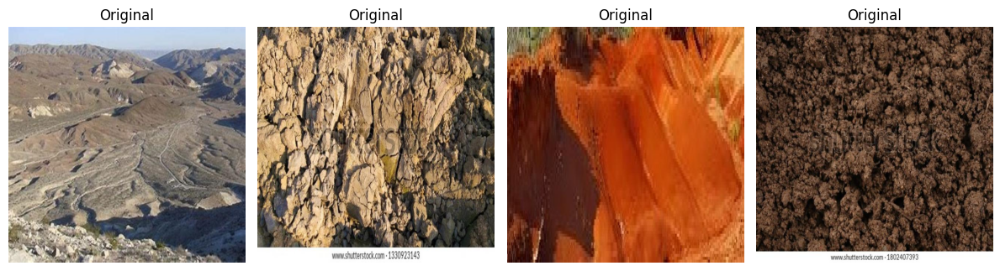

In [ ]:
import matplotlib.pyplot as plt
import random
import os
import cv2

# -------------------------
# Paths
# -------------------------
ORIGINAL = TRAIN_OUT_IMG          # processed/train/images
AUGMENTED = AUGMENTED_DIR         # processed/augmented

# -------------------------
# Function to display random samples
# -------------------------
def show_samples():
    orig_imgs = os.listdir(ORIGINAL)
    aug_imgs = os.listdir(AUGMENTED)

    # Select random 4 images from each
    sample_orig = random.sample(orig_imgs, 4)
    sample_aug = random.sample(aug_imgs, 4)

    plt.figure(figsize=(12, 8))

    # ---- Plot original images ----
    for i, img_name in enumerate(sample_orig):
        img_path = os.path.join(ORIGINAL, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 4, i + 1)
        plt.imshow(img)
        plt.title("Original")
        plt.axis("off")

    '''# ---- Plot augmented images ----
    for i, img_name in enumerate(sample_aug):
        img_path = os.path.join(AUGMENTED, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 4, i + 5)
        plt.imshow(img)
        plt.title("Augmented")
        plt.axis("off")'''

    plt.tight_layout()
    plt.show()

# Run function
show_samples()


In [ ]:
import os

TEST_IMG = "/content/processed/test/images"
print(os.listdir(TEST_IMG)[:10])


['OIP-raUzyqtNr7IxQ0aTNBpYYAHaJ4_jpg.rf.5f04ee10efec74d9f7bfc0b3b66e07e5.jpg', 'footprint-on-ground-soil-green-260nw-1989753302_jpg.rf.471b75f9a457fe6b2b930f03a526681c.jpg', 'OIP-HxR3HmFmEDtRwv49xNa6tAHaFc_jpg.rf.3e0b4def7e54f277d2085d8e99237e23.jpg', 'vertical-texture-red-dry-clay-260nw-95698423_jpg.rf.84b5a11a0df3b6a6218f7db86afb31d6.jpg', 'brown-soil-texture-background-cultivated-260nw-1898667757_jpg.rf.5acd27a74577427cfe6208a238b19114.jpg', 'texture-dried-earth-clay-sand-260nw-1344131942_jpg.rf.fa25c57e4bc188d33b298abed17ac9f6.jpg', 'soil-upper-layer-earth-which-600w-1857677119_jpg.rf.5f603136d0837aac5e26e4f5efd312e4.jpg', 'Red_43_jpg.rf.65ef688a7c7195195ddaaf0595d44036.jpg', 'Clay_47_jpg.rf.75ea8b632fb8f5e1a540b31945d9ff4d.jpg', 'OIP-KVkf9QJRKPigCm0hKBI3qAEsDh_jpg.rf.1d286073555a8bb4141a928f57e3c1a7.jpg']


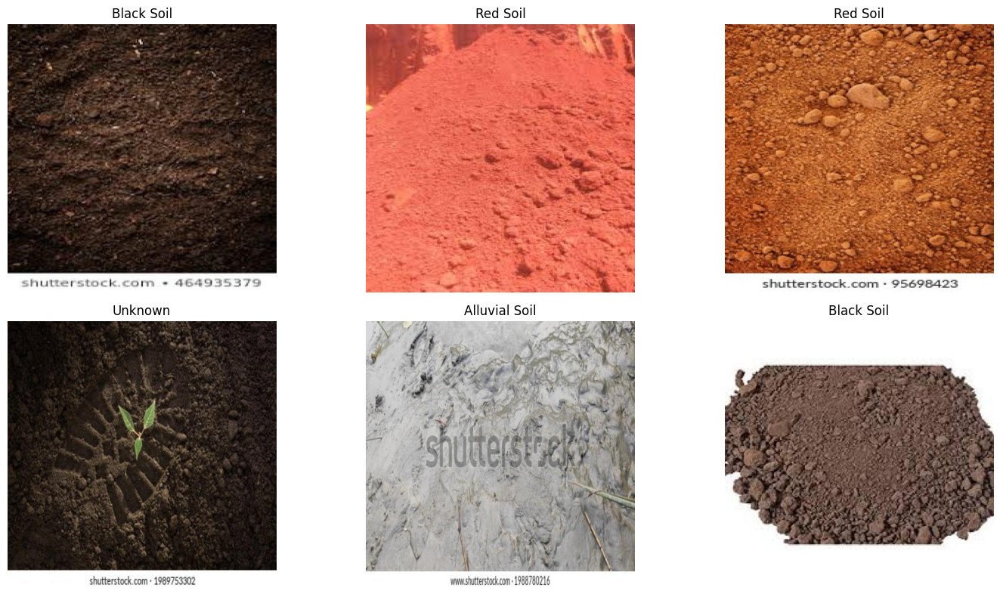

In [ ]:
import matplotlib.pyplot as plt
import os
import cv2

# Path to test images
TEST_IMG = "/content/processed/test/images"

# Pick 6 random test images (or fewer if folder small)
sample_images = [
    'Black_38_jpg.rf.cce2afe5e739cb1d77fbdfd7d51d5012.jpg',
    'Red_44_jpg.rf.166b249f96dfcba4e9996f754ed4ecaf.jpg',
    'vertical-texture-red-dry-clay-260nw-95698423_jpg.rf.84b5a11a0df3b6a6218f7db86afb31d6.jpg',
    'footprint-on-ground-soil-green-260nw-1989753302_jpg.rf.471b75f9a457fe6b2b930f03a526681c.jpg',
    'alluvial-soil-geographical-study-reference-600w-1988780216_jpg.rf.212572abc4ca1273ec29a6529edd8e83.jpg',
    'Black_44_jpg.rf.bfb078e5b0304edb36b2cc1d57ea3cbc.jpg'
]

# Map filenames to soil/land names
def soil_name(filename):
    filename = filename.lower()
    if "black" in filename:
        return "Black Soil"
    elif "red" in filename:
        return "Red Soil"
    elif "alluvial" in filename:
        return "Alluvial Soil"
    elif "clay" in filename:
        return "Clay Soil"
    else:
        return "Unknown"

# Plot images
plt.figure(figsize=(15, 8))
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(TEST_IMG, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(soil_name(img_name))
    plt.axis("off")

plt.tight_layout()
plt.show()



In [ ]:
"""
train: /content/processed/train/images
val: /content/processed/test/images
nc: 5
names: ['Black Soil','Red Soil','Clay Soil','Alluvial Soil']
"""

with open("/content/processed/data.yaml", "w") as f:
    f.write(data_yaml)

print("✅ data.yaml created!")


NameError: name 'data_yaml' is not defined

In [ ]:
# data.yaml example
train: "/content/processed/train/images"
val: "/content/processed/test/images"
nc: 5   # number of soil/land classes
names: ['Black Soil','Red Soil','Clay Soil','Alluvial Soil']


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.4 MB/s eta 0:00:00


In [ ]:
# Path to save YAML
yaml_path = "/content/processed/data.yaml"

# Create data.yaml content
data_yaml = """
train: /content/processed/train/images
val: /content/processed/test/images
nc: 5
names: ['Black Soil','Red Soil','Clay Soil','Alluvial Soil']
"""

# Write to file
import os
os.makedirs("/content/processed", exist_ok=True)
with open(yaml_path, "w") as f:
    f.write(data_yaml)

print("✅ data.yaml created at:", yaml_path)


✅ data.yaml created at: /content/processed/data.yaml


In [ ]:
!yolo task=detect mode=train model=yolov8s.pt \
data="/content/Soil-detection-3/data.yaml" \
epochs=200 imgsz=768 batch=16 device=0 \
optimizer=AdamW cos_lr=True \
name=train2 augment=True

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/Soil-detection-3/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=768, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train22, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.0, plots=True, 

In [ ]:
!yolo task=detect mode=train model=yolov8n.pt data="/content/processed/data.yaml" epochs=50 imgsz=512 batch=16

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
WARNING ⚠️ Download failure, retrying 1/3 https://github.com/ultralytics/assets/releases/download/v8.3.0/yolov8n.pt... HTTP Error 503: Service Unavailable
######################################################################## 100.0%
Ultralytics 8.3.236 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/processed/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, 

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train3/weights/best.pt")
metrics = model.val()  # evaluate model


precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")


Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1866.4±698.8 MB/s, size: 88.5 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 12.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.8s
                   all         58         72      0.654      0.528      0.531      0.332
         Alluvial Soil         18         21      0.366      0.571      0.373      0.199
            Black Soil         17         21      0.699      0.905      0.877      0.557
             Clay Soil          9         11          1      0.162      0.339      0.249
              Red Soil         15         19      0.551      0.474      0.535      0.324
Speed: 12.1ms preprocess, 18.4ms inference,

In [ ]:
from ultralytics import YOLO

yolo_model = YOLO("/content/runs/detect/train3/weights/best.pt")

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="BYeHkeZIrf9VaHXpKp3Y")
project = rf.workspace("test1-2oray").project("deteksijeruk")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to deteksiJeruk-1 in yolov8:: 100%|██████████| 584/584 [00:00<00:00, 4112.26it/s]


In [ ]:
import os
label_dir = "/content/processed/train/labels"
count = {}
for filename in os.listdir(label_dir):
    path = os.path.join(label_dir, filename)
    with open(path, "r") as f:
        cls = int(f.readline().split()[0])
        count[cls] = count.get(cls, 0) + 1
print("Training images per class:", count)

Training images per class: {2: 29, 3: 51, 1: 55, 0: 64}



image 1/1 /content/deteksiJeruk-1/train/images/Red_20_jpg.rf.acbf86070abb5e4498642cca66a5abb0.jpg: 512x512 1 Red Soil, 54.5ms
Speed: 15.1ms preprocess, 54.5ms inference, 6.2ms postprocess per image at shape (1, 3, 512, 512)


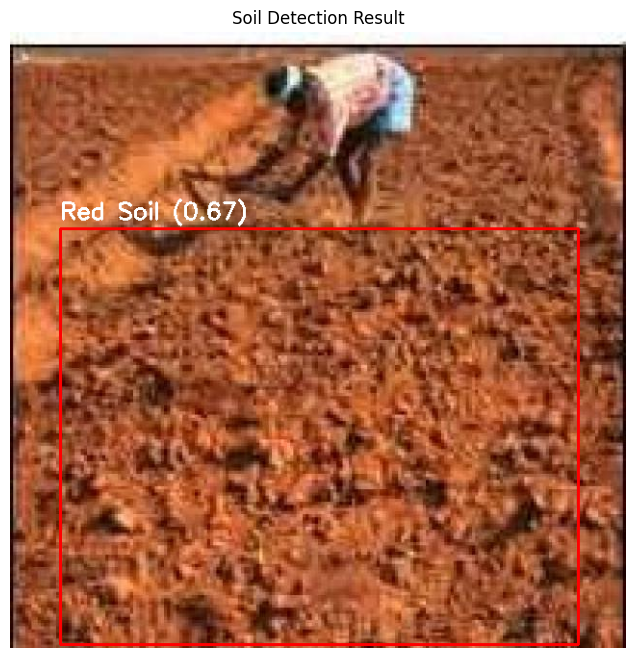

Predicted Soil Type: Red Soil
Confidence: 0.6743578910827637


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/deteksiJeruk-1/train/images/Red_20_jpg.rf.acbf86070abb5e4498642cca66a5abb0.jpg"

# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()

soil_name = "Unknown"
confidence = 0.0

# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/deteksiJeruk-1/train/images/Copy-of-images422-1-_jpg.rf.e2b051eda1996bce6fb4a19849c97f25.jpg: 512x512 1 Black Soil, 26.2ms
Speed: 5.7ms preprocess, 26.2ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)


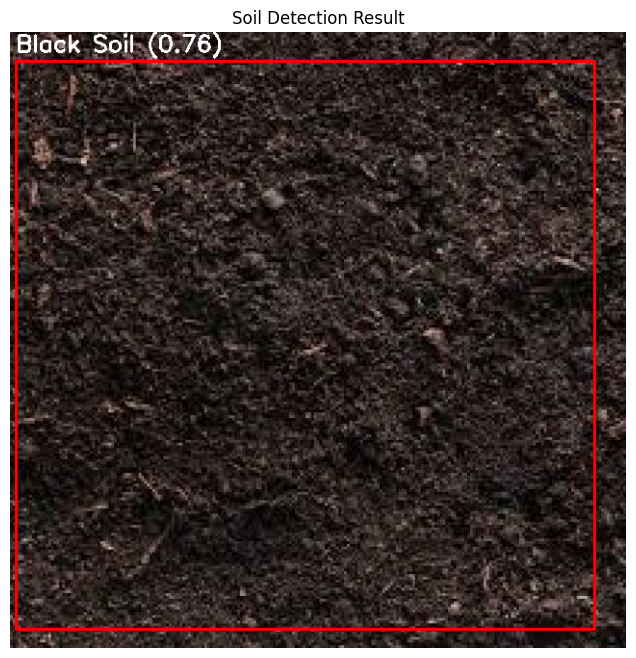

Predicted Soil Type: Black Soil
Confidence: 0.7579206228256226


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/deteksiJeruk-1/train/images/Copy-of-images422-1-_jpg.rf.e2b051eda1996bce6fb4a19849c97f25.jpg"

# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()

soil_name = "Unknown"
confidence = 0.0

# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/Soil-detection-3/test/images/soil-upper-layer-earth-which-600w-1857677119_jpg.rf.5f603136d0837aac5e26e4f5efd312e4.jpg: 512x512 1 Alluvial Soil, 25.5ms
Speed: 7.5ms preprocess, 25.5ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)


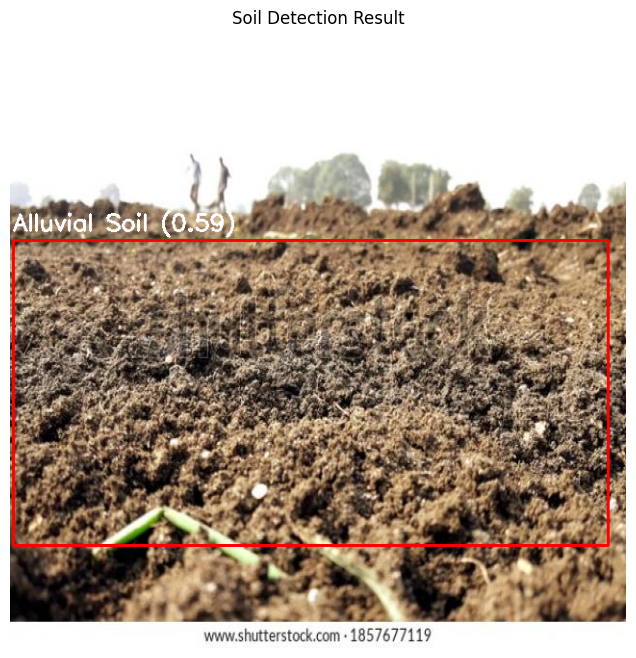

Predicted Soil Type: Alluvial Soil
Confidence: 0.5881935358047485


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/Soil-detection-3/test/images/soil-upper-layer-earth-which-600w-1857677119_jpg.rf.5f603136d0837aac5e26e4f5efd312e4.jpg"

# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()

soil_name = "Unknown"
confidence = 0.0

# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)


In [ ]:
from ultralytics import YOLO

# Load your trained soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Print class names
print("Classes in the model:")
for cls_id, name in model.names.items():
    print(cls_id, ":", name)

print("\nTotal number of classes:", len(model.names))


Classes in the model:
0 : Alluvial Soil
1 : Black Soil
2 : Clay Soil
3 : Red Soil

Total number of classes: 4


In [ ]:
import os

for root, dirs, files in os.walk("/content", topdown=True):
    for f in files:
        if f.endswith(".yaml"):
            print(os.path.join(root, f))


/content/.config/.last_survey_prompt.yaml
/content/.config/.last_opt_in_prompt.yaml
/content/runs/detect/train3/args.yaml
/content/runs/detect/train/args.yaml
/content/runs/detect/train2/args.yaml
/content/processed/data.yaml
/content/deteksiJeruk-1/data.yaml
/content/Soil-detection-3/data.yaml



image 1/1 /content/redddd.jpeg: 384x512 1 Red Soil, 52.0ms
Speed: 1.4ms preprocess, 52.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 512)


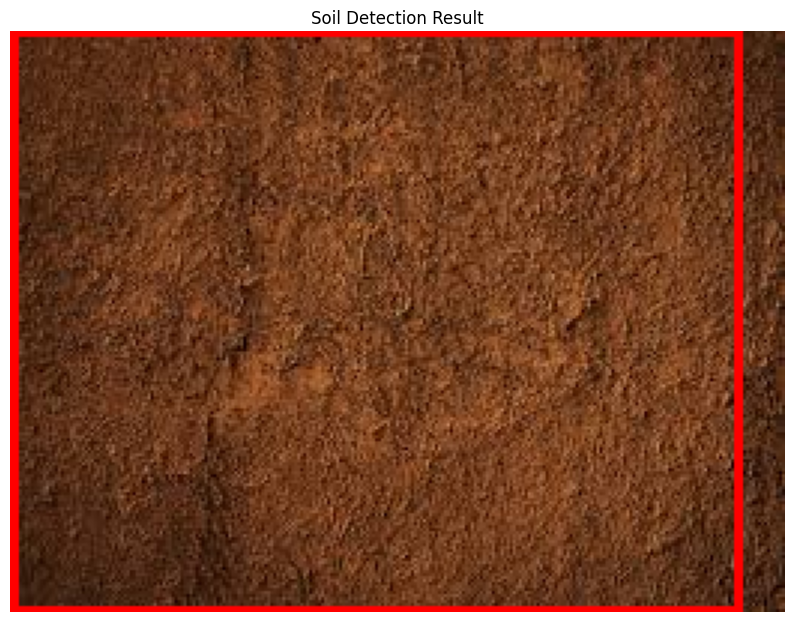

Predicted Soil Type: Red Soil
Confidence: 0.5294905304908752


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/redddd.jpeg"
# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()


# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/img2.jpeg: 384x512 1 Alluvial Soil, 20.5ms
Speed: 1.9ms preprocess, 20.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 512)


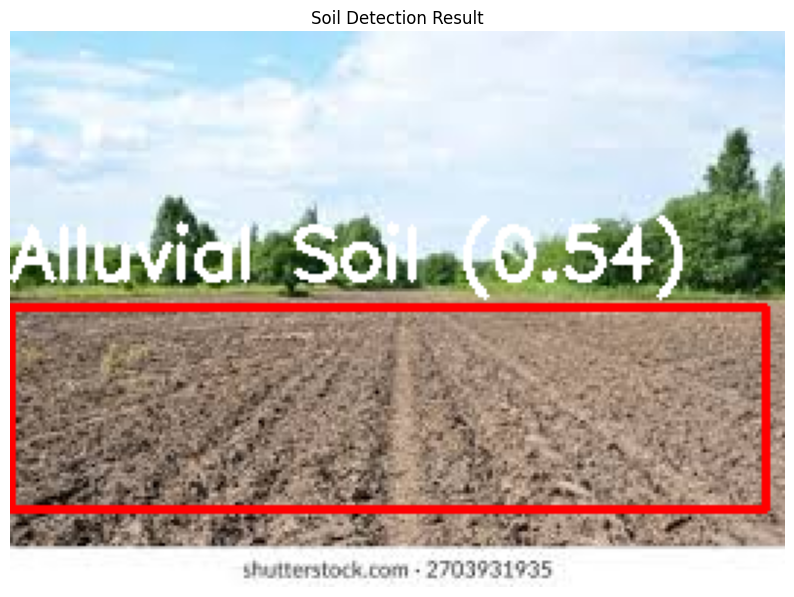

Predicted Soil Type: Alluvial Soil
Confidence: 0.5418422818183899


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/img2.jpeg"
# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()


# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/redclay.jpeg: 352x512 1 Red Soil, 147.0ms
Speed: 3.8ms preprocess, 147.0ms inference, 4.3ms postprocess per image at shape (1, 3, 352, 512)


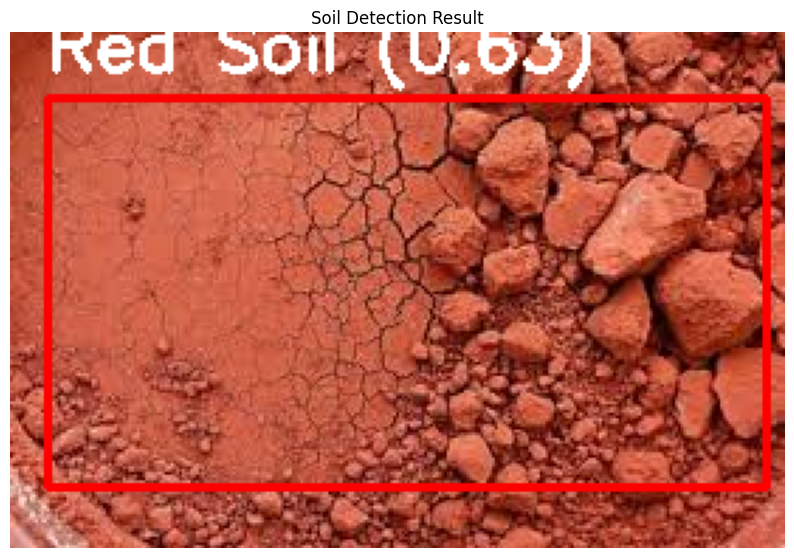

Predicted Soil Type: Red Soil
Confidence: 0.6332169771194458


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/redclay.jpeg"
# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()


# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/red..jpeg: 512x512 1 Red Soil, 34.1ms
Speed: 4.4ms preprocess, 34.1ms inference, 5.4ms postprocess per image at shape (1, 3, 512, 512)


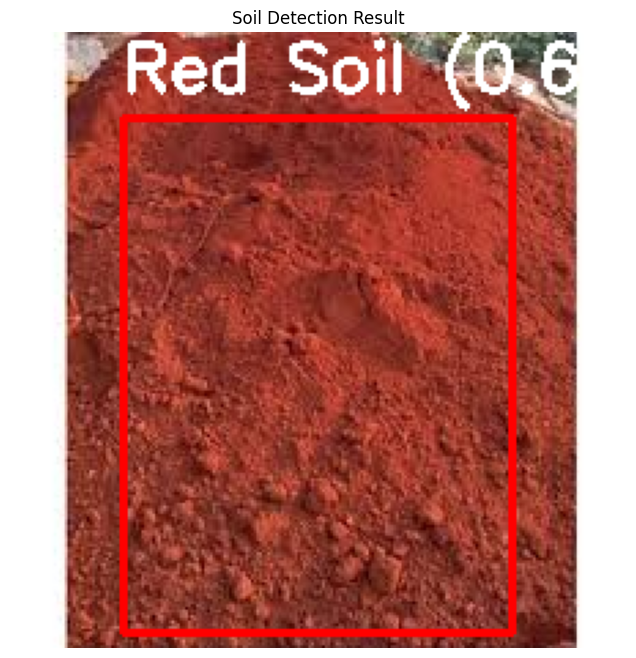

Predicted Soil Type: Red Soil
Confidence: 0.629072368144989


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/red..jpeg"
# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()


# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/alliv.jpeg: 512x512 1 Red Soil, 25.3ms
Speed: 2.1ms preprocess, 25.3ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


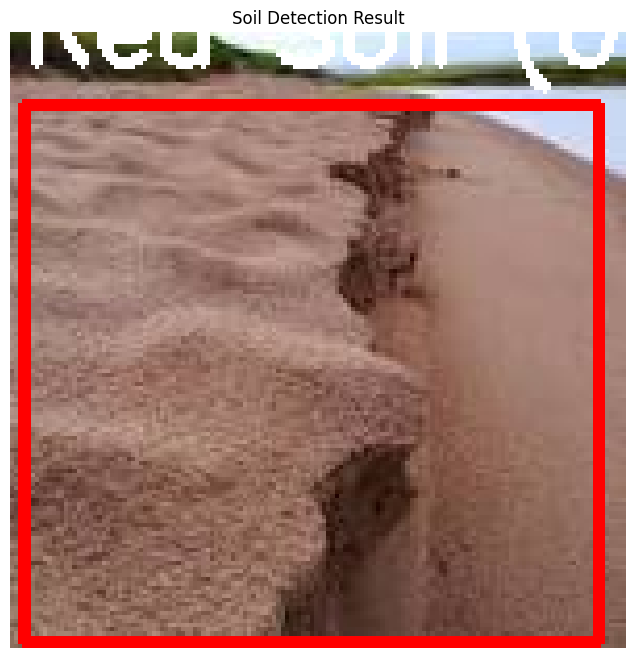

Predicted Soil Type: Red Soil
Confidence: 0.4657291769981384


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/alliv.jpeg"
# Run prediction
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()


# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)



image 1/1 /content/blacksoil.png: 352x512 1 Black Soil, 26.0ms
Speed: 2.1ms preprocess, 26.0ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 512)


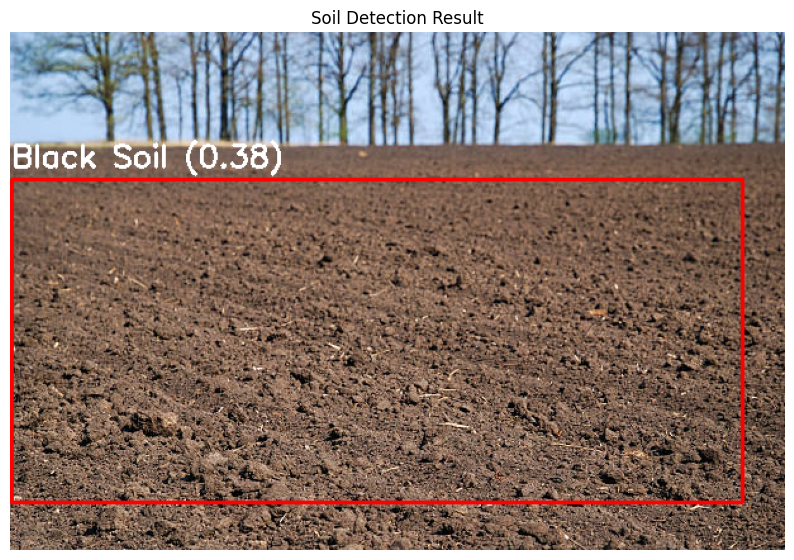

Predicted Soil Type: Black Soil
Confidence: 0.38309842348098755


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO soil detection model
model = YOLO("/content/runs/detect/train3/weights/best.pt")

# Input image path
img_path = "/content/blacksoil.png"
results = model.predict(img_path)[0]

# Read and convert the image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img = img.copy()


# Draw detected boxes
if results.boxes is not None:
    for box in results.boxes:
        # Extract coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        soil_name = results.names[cls_id]

        # Draw rectangle
        cv2.rectangle(display_img, (int(x1), int(y1)), (int(x2), int(y2)),
                      (255, 0, 0), 2)

        # Add soil label
        label = f"{soil_name} ({confidence:.2f})"
        cv2.putText(display_img, label, (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Show annotated image
plt.figure(figsize=(10, 8))
plt.imshow(display_img)
plt.axis("off")
plt.title("Soil Detection Result")
plt.show()

print("Predicted Soil Type:", soil_name)
print("Confidence:", confidence)


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd

# --- PATHS ---
images_path = "/content/Soil-detection-3/train/images"
labels_path = "/content/Soil-detection-3/train/labels"

data = []

def extract_color_hist(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Histogram for each channel (256 bins each)
    hist_r = cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
    hist_g = cv2.calcHist([img], [1], None, [256], [0, 256]).flatten()
    hist_b = cv2.calcHist([img], [2], None, [256], [0, 256]).flatten()

    hist = np.concatenate([hist_r, hist_g, hist_b])
    hist = hist / np.sum(hist)  # normalize

    return hist

# --- READ IMAGES + LABELS ---
for file in os.listdir(images_path):
    if file.endswith(".jpg") or file.endswith(".png"):
        image_file = os.path.join(images_path, file)
        label_file = os.path.join(labels_path, file.replace(".jpg", ".txt").replace(".png", ".txt"))

        # skip if label missing
        if not os.path.exists(label_file):
            continue

        # read YOLO label (first number = class)
        with open(label_file, "r") as f:
            class_id = int(f.readline().split()[0])

        # extract image features
        features = extract_color_hist(image_file)

        # add label to the end
        row = np.append(features, class_id)
        data.append(row)

# Convert to DataFrame
columns = [f"f{i}" for i in range(len(data[0]) - 1)] + ["label"]
df = pd.DataFrame(data, columns=columns)

# Save CSV
df.to_csv("features.csv", index=False)

print("CSV saved as features.csv with shape:", df.shape)


CSV saved as features.csv with shape: (199, 769)


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# ------------------------------
# 1. Load your CSV
# ------------------------------
df = pd.read_csv("features.csv")

# Features and labels
X = df.drop("label", axis=1)
y = df["label"]

# ------------------------------
# 2. Train-Test Split
# ------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# ------------------------------
# 3. Scale features for SVM/Logistic
# ------------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Store results
results = {}

# ------------------------------
# 4. Logistic Regression
# ------------------------------
log_reg = LogisticRegression(max_iter=500)
log_reg.fit(X_train_scaled, y_train)
pred = log_reg.predict(X_test_scaled)
results["Logistic Regression"] = accuracy_score(y_test, pred)

# ------------------------------
# 5. Linear SVM (LinearSVC)
# ------------------------------
lin_svm = LinearSVC()
lin_svm.fit(X_train_scaled, y_train)
pred = lin_svm.predict(X_test_scaled)
results["Linear SVM"] = accuracy_score(y_test, pred)

# ------------------------------
# 6. RBF SVM (SVC)
# ------------------------------
rbf_svm = SVC(kernel='rbf', C=1.0, gamma='scale')
rbf_svm.fit(X_train_scaled, y_train)
pred = rbf_svm.predict(X_test_scaled)
results["RBF SVM"] = accuracy_score(y_test, pred)

# ------------------------------
# 7. Random Forest
# ------------------------------
rf = RandomForestClassifier(n_estimators=250, random_state=42)
rf.fit(X_train, y_train)
pred = rf.predict(X_test)
results["Random Forest"] = accuracy_score(y_test, pred)

# ------------------------------
# 8. XGBoost
# ------------------------------
xgb = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss'
)

xgb.fit(X_train, y_train)
pred = xgb.predict(X_test)
results["XGBoost"] = accuracy_score(y_test, pred)

# ------------------------------
# 9. Print results
# ------------------------------
print("\nAccuracy Scores: \n")
for model, acc in results.items():
    print(f"{model}: {acc:.4f}")


Liblinear failed to converge, increase the number of iterations.



Accuracy Scores: 

Logistic Regression: 0.8250
Linear SVM: 0.7250
RBF SVM: 0.8250
Random Forest: 0.7750
XGBoost: 0.8250



Accuracy Scores (Improved)
Logistic Regression: 0.8250
Linear SVM: 0.7250
RBF SVM: 0.8500
Random Forest: 0.7750
XGBoost: 0.8250


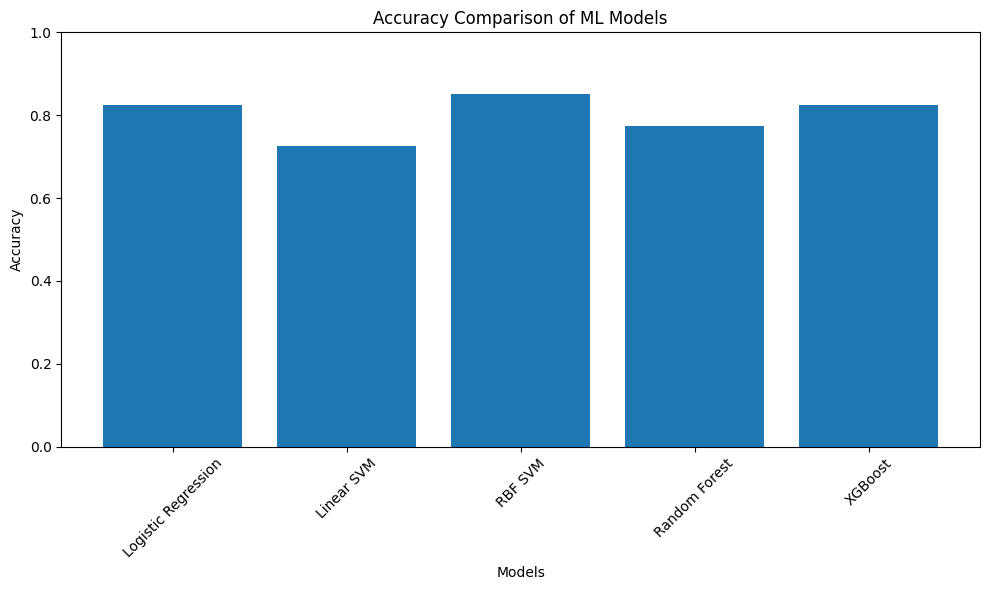

X has feature names, but SVC was fitted without feature names


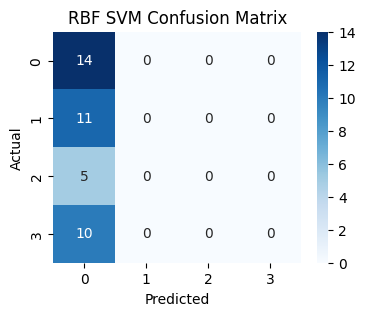

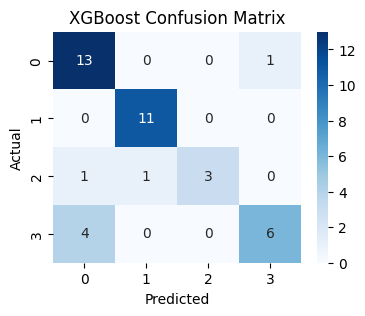


 SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.88      1.00      0.93        14
         1.0       0.92      1.00      0.96        11
         2.0       1.00      0.40      0.57         5
         3.0       0.90      0.90      0.90        10

    accuracy                           0.90        40
   macro avg       0.92      0.82      0.84        40
weighted avg       0.91      0.90      0.89        40

XGBoost Classification Report:

              precision    recall  f1-score   support

         0.0       0.72      0.93      0.81        14
         1.0       0.92      1.00      0.96        11
         2.0       1.00      0.60      0.75         5
         3.0       0.86      0.60      0.71        10

    accuracy                           0.82        40
   macro avg       0.87      0.78      0.81        40
weighted avg       0.84      0.82      0.82        40

              precision    recall  f1-score   support

         0.0  

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Load data
df = pd.read_csv("features.csv")
X = df.drop("label", axis=1)
y = df["label"]

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

results = {}

# ----------------------------------------------------
# 1. Logistic Regression (improved)
# ----------------------------------------------------
log_reg = LogisticRegression(
    max_iter=2000,
    solver='lbfgs',
    C=1.5
)
log_reg.fit(X_train_scaled, y_train)
results["Logistic Regression"] = accuracy_score(y_test, log_reg.predict(X_test_scaled))

# ----------------------------------------------------
# 2. Linear SVM (fixed convergence)
# ----------------------------------------------------
lin_svm = LinearSVC(
    C=1.0,
    max_iter=5000,
    dual=False  # Works better for many features
)
lin_svm.fit(X_train_scaled, y_train)
results["Linear SVM"] = accuracy_score(y_test, lin_svm.predict(X_test_scaled))

# ----------------------------------------------------
# 3. RBF SVM (higher accuracy)
# ----------------------------------------------------
rbf_svm = SVC(
    kernel='rbf',
    C=3.0,
    gamma='scale'
)
rbf_svm.fit(X_train_scaled, y_train)
results["RBF SVM"] = accuracy_score(y_test, rbf_svm.predict(X_test_scaled))

# ----------------------------------------------------
# 4. Random Forest (tuned)
# ----------------------------------------------------
rf = RandomForestClassifier(
    n_estimators=350,
    max_depth=12,
    min_samples_split=3,
    random_state=42
)
rf.fit(X_train, y_train)
results["Random Forest"] = accuracy_score(y_test, rf.predict(X_test))

# ----------------------------------------------------
# 5. XGBoost (tuned)
# ----------------------------------------------------
xgb = XGBClassifier(
    n_estimators=350,
    learning_rate=0.04,
    max_depth=7,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss'
)
xgb.fit(X_train, y_train)
results["XGBoost"] = accuracy_score(y_test, xgb.predict(X_test))

# ----------------------------------------------------
# Print Accuracy Scores
# ----------------------------------------------------
print("\nAccuracy Scores (Improved)")
for model, acc in results.items():
    print(f"{model}: {acc:.4f}")
#-----------------------------------------------------
# Ploting the Accuracy

import matplotlib.pyplot as plt

models = list(results.keys())
accuracy = list(results.values())

plt.figure(figsize=(10, 6))
plt.bar(models, accuracy)
plt.ylabel("Accuracy")
plt.xlabel("Models")
plt.title("Accuracy Comparison of ML Models")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def plot_cm(model, X_test, y_test, title):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# Plot confusion matrices
plot_cm(rbf_svm, X_test, y_test, "RBF SVM Confusion Matrix")
plot_cm(xgb, X_test, y_test, "XGBoost Confusion Matrix")



from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# -----------------------------------------------------
# STANDARDIZE FEATURES BEFORE PCA
# -----------------------------------------------------
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------------------------------
# PCA (try 150–250 components)
# -----------------------------------------------------
pca = PCA(n_components=150)  # Adjust
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# -----------------------------------------------------
# Train SVM
# -----------------------------------------------------
svm_model = SVC(kernel="rbf", C=10, gamma="scale")
svm_model.fit(X_train_pca, y_train)

# -----------------------------------------------------
# Evaluate
# -----------------------------------------------------
print("\n SVM Classification Report:")
print(classification_report(y_test, svm_model.predict(X_test_pca)))

print("XGBoost Classification Report:\n")
print(classification_report(y_test, xgb.predict(X_test)))

xgb_pca = XGBClassifier(
    n_estimators=350,
    learning_rate=0.04,
    max_depth=7,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss'
)

xgb_pca.fit(X_train_pca, y_train)
print(classification_report(y_test, xgb_pca.predict(X_test_pca)))



Accuracy Scores:
Logistic Regression: 0.8250
Linear SVM: 0.7250
RBF SVM + PCA: 0.9000
Random Forest: 0.7750
XGBoost: 0.8250


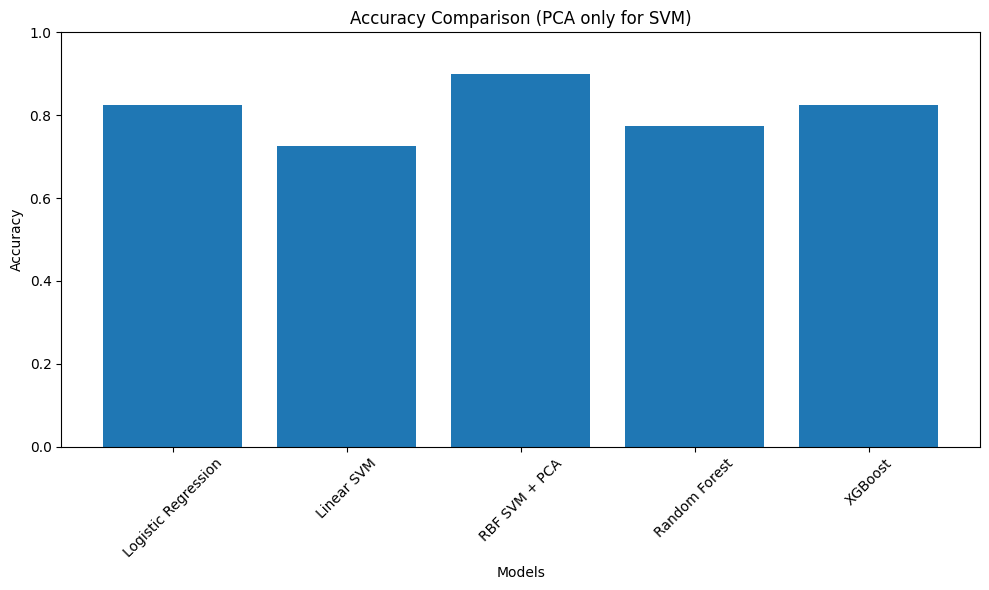

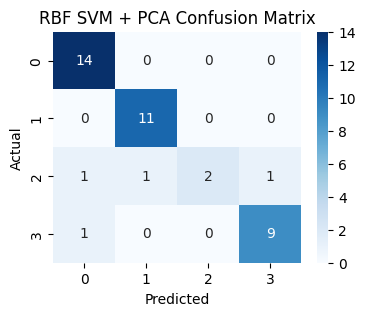

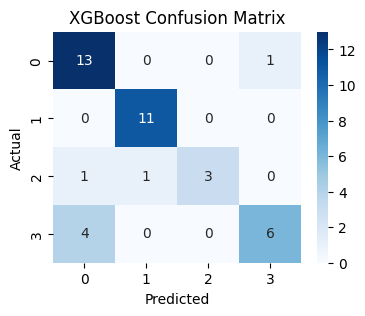


====== RBF SVM + PCA REPORT ======
              precision    recall  f1-score   support

         0.0       0.88      1.00      0.93        14
         1.0       0.92      1.00      0.96        11
         2.0       1.00      0.40      0.57         5
         3.0       0.90      0.90      0.90        10

    accuracy                           0.90        40
   macro avg       0.92      0.82      0.84        40
weighted avg       0.91      0.90      0.89        40


====== XGBoost REPORT ======
              precision    recall  f1-score   support

         0.0       0.72      0.93      0.81        14
         1.0       0.92      1.00      0.96        11
         2.0       1.00      0.60      0.75         5
         3.0       0.86      0.60      0.71        10

    accuracy                           0.82        40
   macro avg       0.87      0.78      0.81        40
weighted avg       0.84      0.82      0.82        40


=== CROSS VALIDATION RESULTS ===
SVM CV Scores : [        0.8  

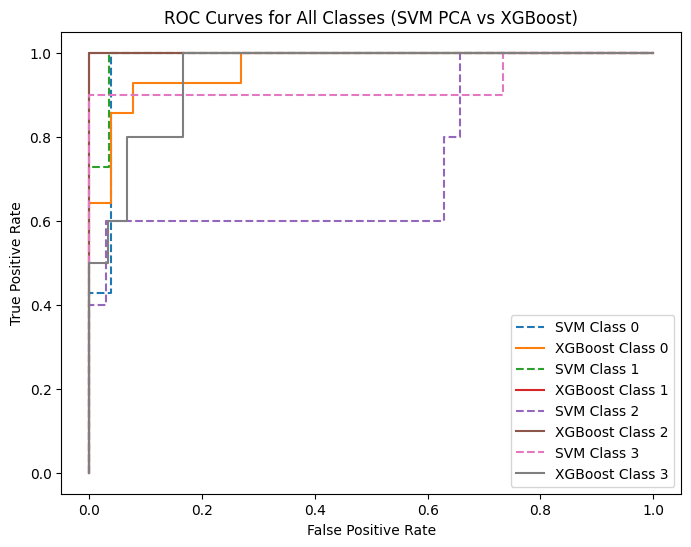

In [ ]:
# ===============================================
# 1. IMPORTS
# ===============================================
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# ===============================================
# 2. LOAD DATA
# ===============================================
df = pd.read_csv("features.csv")
X = df.drop("label", axis=1)
y = df["label"]

# ===============================================
# 3. SPLIT DATA
# ===============================================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# ===============================================
# 4. SCALE DATA (needed for SVM / Logistic)
# ===============================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

results = {}

# ===============================================
# 5. Logistic Regression
# ===============================================
log_reg = LogisticRegression(max_iter=2000, C=1.5)
log_reg.fit(X_train_scaled, y_train)
results["Logistic Regression"] = accuracy_score(y_test, log_reg.predict(X_test_scaled))

# ===============================================
# 6. Linear SVM (No PCA)
# ===============================================
lin_svm = LinearSVC(C=1.0, max_iter=5000, dual=False)
lin_svm.fit(X_train_scaled, y_train)
results["Linear SVM"] = accuracy_score(y_test, lin_svm.predict(X_test_scaled))

# ===============================================
# 7. PCA ONLY FOR SVM (Best Practice)
# ===============================================
pca = PCA(n_components=150)    # Tune 100–200
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

svm_pca = SVC(kernel="rbf", C=10, gamma="scale")
svm_pca.fit(X_train_pca, y_train)
results["RBF SVM + PCA"] = accuracy_score(y_test, svm_pca.predict(X_test_pca))

# ===============================================
# 8. Random Forest (NO PCA)
# ===============================================
rf = RandomForestClassifier(
    n_estimators=350,
    max_depth=12,
    min_samples_split=3,
    random_state=42
)
rf.fit(X_train, y_train)
results["Random Forest"] = accuracy_score(y_test, rf.predict(X_test))

# ===============================================
# 9. XGBoost (NO PCA)
# ===============================================
xgb = XGBClassifier(
    n_estimators=350,
    learning_rate=0.04,
    max_depth=7,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss'
)
xgb.fit(X_train, y_train)
results["XGBoost"] = accuracy_score(y_test, xgb.predict(X_test))

# ===============================================
# PRINT ACCURACIES
# ===============================================
print("\nAccuracy Scores:")
for model, acc in results.items():
    print(f"{model}: {acc:.4f}")

# ===============================================
# PLOT ACCURACIES
# ===============================================
plt.figure(figsize=(10, 6))
plt.bar(results.keys(), results.values())
plt.ylabel("Accuracy")
plt.xlabel("Models")
plt.title("Accuracy Comparison (PCA only for SVM)")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

# ===============================================
# CONFUSION MATRIX FUNCTION
# ===============================================
def plot_cm(model, X_test, y_test, title):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# RBF SVM + PCA CM
plot_cm(svm_pca, X_test_pca, y_test, "RBF SVM + PCA Confusion Matrix")

# XGBoost CM
plot_cm(xgb, X_test, y_test, "XGBoost Confusion Matrix")

# ===============================================
# REPORTS
# ===============================================
print("\n====== RBF SVM + PCA REPORT ======")
print(classification_report(y_test, svm_pca.predict(X_test_pca)))

print("\n====== XGBoost REPORT ======")
print(classification_report(y_test, xgb.predict(X_test)))


from sklearn.model_selection import cross_val_score
svm_cv_scores = cross_val_score(svm_pca, pca.transform(scaler.transform(X)), y, cv=5)
xgb_cv_scores = cross_val_score(xgb, X, y, cv=5)

print("\n=== CROSS VALIDATION RESULTS ===")
print("SVM CV Scores :", svm_cv_scores)
print("SVM Mean CV   :", svm_cv_scores.mean())

print("XGBoost CV Scores :", xgb_cv_scores)
print("XGBoost Mean CV   :", xgb_cv_scores.mean())




# ===============================================
# ROC CURVE (SVM PCA vs XGBoost)
# ===============================================
from sklearn.metrics import roc_curve
from sklearn.preprocessing import label_binarize

# Convert labels to binary (One-vs-Rest)
y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3])

# Decision function from SVM PCA model
svm_probs = svm_pca.decision_function(X_test_pca)   # (40, 4)

# XGBoost class probabilities
xgb_probs = xgb.predict_proba(X_test)               # (40, 4)

plt.figure(figsize=(8, 6))

for i in range(4):
    # SVM
    fpr_svm, tpr_svm, _ = roc_curve(y_test_bin[:, i], svm_probs[:, i])
    # XGBoost
    fpr_xgb, tpr_xgb, _ = roc_curve(y_test_bin[:, i], xgb_probs[:, i])

    plt.plot(fpr_svm, tpr_svm, linestyle='--', label=f"SVM Class {i}")
    plt.plot(fpr_xgb, tpr_xgb, label=f"XGBoost Class {i}")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for All Classes (SVM PCA vs XGBoost)")
plt.legend()
plt.show()


SVM Accuracy: 0.9000

Classification Report:
              precision    recall  f1-score   support

         0.0       0.88      1.00      0.93        14
         1.0       0.92      1.00      0.96        11
         2.0       1.00      0.40      0.57         5
         3.0       0.90      0.90      0.90        10

    accuracy                           0.90        40
   macro avg       0.92      0.82      0.84        40
weighted avg       0.91      0.90      0.89        40



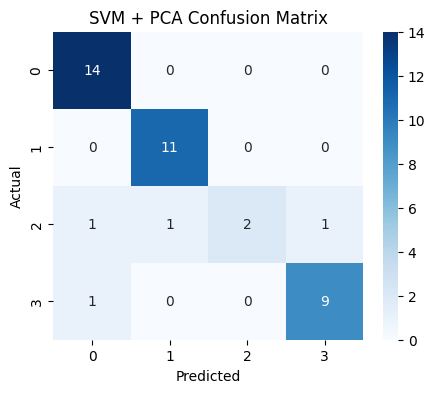


Models saved:
✔ scaler.pkl
✔ pca.pkl
✔ svm_pca_model.pkl


In [ ]:
# ===============================================
# 1. IMPORTS
# ===============================================
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# ===============================================
# 2. LOAD DATA
# ===============================================
df = pd.read_csv("features.csv")
X = df.drop("label", axis=1)
y = df["label"]

# ===============================================
# 3. TRAIN-TEST SPLIT
# ===============================================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# ===============================================
# 4. STANDARDIZE (MANDATORY FOR SVM)
# ===============================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ===============================================
# 5. PCA (ONLY FOR SVM)
# ===============================================
pca = PCA(n_components=150)    # tune if needed
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# ===============================================
# 6. TRAIN SVM MODEL
# ===============================================
svm_model = SVC(kernel="rbf", C=10, gamma="scale", probability=True)
svm_model.fit(X_train_pca, y_train)

# ===============================================
# 7. EVALUATION
# ===============================================
y_pred = svm_model.predict(X_test_pca)
acc = accuracy_score(y_test, y_pred)

print("\n======================")
print(f"SVM Accuracy: {acc:.4f}")
print("======================\n")

print("Classification Report:")
print(classification_report(y_test, y_pred))

# ===============================================
# 8. CONFUSION MATRIX
# ===============================================
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("SVM + PCA Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ===============================================
# 9. SAVE MODELS (IMPORTANT!)
# ===============================================
joblib.dump(scaler, "scaler.pkl")
joblib.dump(pca, "pca.pkl")
joblib.dump(svm_model, "svm_pca_model.pkl")

print("\nModels saved:")
print("✔ scaler.pkl")
print("✔ pca.pkl")
print("✔ svm_pca_model.pkl")

In [ ]:
import os
import cv2
import torch
import numpy as np
import torch.nn as nn
import torchvision
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
class SegmentationDataset(Dataset):
    def __init__(self, img_dir, mask_dir):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.images = sorted(os.listdir(img_dir))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image / 255.0

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = mask.astype(np.int64)

        image = torch.tensor(image, dtype=torch.float).permute(2, 0, 1)
        mask = torch.tensor(mask, dtype=torch.long)

        return image, mask


In [ ]:
import torchvision
import torch.nn as nn

model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)

# Change output classes (example: 2 → background + soil)
model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1)


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:01<00:00, 88.2MB/s]


In [ ]:
train_dataset = SegmentationDataset(
    "/content/Soil-detection-3/train/images",
    "/content/Soil-detection-3/train/masks"
)

val_dataset = SegmentationDataset(
    "/content/Soil-detection-3/valid/images",
    "/content/Soil-detection-3/valid/masks"
)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)


In [ ]:
model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)

# 2 classes: background + soil
model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1)


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


In [ ]:
epochs = 25

for epoch in range(epochs):
    model.train()
    total_loss = 0

    for images, masks in tqdm(train_loader):
        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)["out"]
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{epochs}]  Loss: {total_loss/len(train_loader):.4f}")


  0%|          | 0/50 [00:00<?, ?it/s]


AttributeError: 'NoneType' object has no attribute 'astype'

In [ ]:
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="BYeHkeZIrf9VaHXpKp3Y")
project = rf.workspace("imit-h5ows").project("soil-detection-l0ngo")
version = project.version(3)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 44.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 85.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Soil-detection-3 in yolov8:: 100%|██████████| 582/582 [00:00<00:00, 7488.06it/s]


In [ ]:
from pathlib import Path

DATA_DIR = Path('/content/Soil-detection-3')  # change if path different

for split in ['train','valid','test']:
    img_dir = DATA_DIR/split/'images'
    lbl_dir = DATA_DIR/split/'labels'
    imgs = sorted([p for p in img_dir.iterdir() if p.is_file()])
    lbls = sorted([p for p in lbl_dir.iterdir() if p.is_file()])
    print(f"{split.upper():5s} -> images: {len(imgs):3d}, labels: {len(lbls):3d}")


TRAIN -> images: 199, labels: 199
VALID -> images:  58, labels:  58
TEST  -> images:  28, labels:  28


In [ ]:
import os
import cv2
import albumentations as A
from tqdm import tqdm

# Paths
IMG_DIR = "/content/Soil-detection-3/train/images"
LBL_DIR = "/content/Soil-detection-3/train/labels"

OUT_IMG = "/content/processed/train/images"
OUT_LBL = "/content/processed/train/labels"

os.makedirs(OUT_IMG, exist_ok=True)
os.makedirs(OUT_LBL, exist_ok=True)

# Albumentations pipeline (YOLO SAFE)
augmentor = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.Rotate(limit=10, p=0.5),
        A.GaussianBlur(p=0.2),
        A.RandomScale(scale_limit=0.2, p=0.4),
    ],
    bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"])
)

def load_labels(label_path):
    boxes, labels = [], []
    with open(label_path, "r") as f:
        for line in f:
            cls, x, y, w, h = map(float, line.split())
            boxes.append([x, y, w, h])
            labels.append(int(cls))
    return boxes, labels

def save_labels(path, boxes, labels):
    with open(path, "w") as f:
        for cls, box in zip(labels, boxes):
            f.write(f"{cls} {' '.join(map(str, box))}\n")

# Augmentation loop
for img_name in tqdm(os.listdir(IMG_DIR), desc="Augmenting YOLO data"):
    img_path = os.path.join(IMG_DIR, img_name)
    lbl_path = os.path.join(LBL_DIR, img_name.replace(".jpg", ".txt"))

    if not os.path.exists(lbl_path):
        continue

    image = cv2.imread(img_path)
    h, w, _ = image.shape

    boxes, labels = load_labels(lbl_path)

    augmented = augmentor(
        image=image,
        bboxes=boxes,
        class_labels=labels
    )

    aug_img = augmented["image"]
    aug_boxes = augmented["bboxes"]
    aug_labels = augmented["class_labels"]

    # Save augmented image
    out_img_path = os.path.join(OUT_IMG, "aug_" + img_name)
    out_lbl_path = os.path.join(OUT_LBL, "aug_" + img_name.replace(".jpg", ".txt"))

    cv2.imwrite(out_img_path, aug_img)
    save_labels(out_lbl_path, aug_boxes, aug_labels)

print("✅ YOLO augmentation completed successfully")


Augmenting YOLO data: 100%|██████████| 199/199 [00:04<00:00, 42.88it/s]

✅ YOLO augmentation completed successfully


In [ ]:
import numpy as np
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from PIL import Image
from tqdm import tqdm

ENCODE_DIR = "/content/processed/encodings"
os.makedirs(ENCODE_DIR, exist_ok=True)

encoder = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")

for img_name in tqdm(os.listdir(OUT_IMG), desc="Encoding images"):
    img_path = os.path.join(OUT_IMG, img_name)

    img = Image.open(img_path).convert("RGB").resize((224, 224))
    img = preprocess_input(np.array(img))
    img = np.expand_dims(img, axis=0)

    embedding = encoder.predict(img, verbose=0)
    np.save(os.path.join(ENCODE_DIR, img_name.replace(".jpg", ".npy")), embedding)

print("✅ Encodings generated (NOT used for YOLO)")


`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Encoding images: 100%|██████████| 199/199 [00:30<00:00,  6.62it/s]

✅ Encodings generated (NOT used for YOLO)


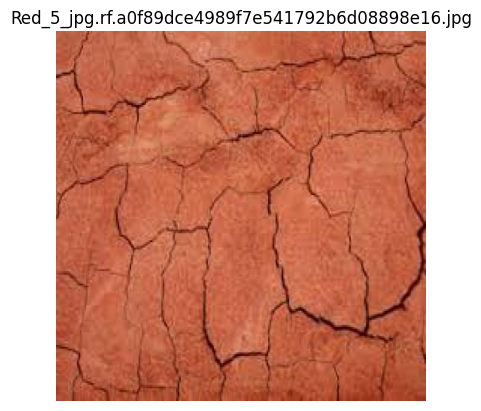

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

img_dir = DATA_DIR/'train'/'images'
rand_img = random.choice(list(img_dir.glob('*')))
img = Image.open(rand_img)

plt.imshow(img)
plt.title(rand_img.name)
plt.axis('off')
plt.show()


Class names from data.yaml: ['Alluvial Soil', 'Black Soil', 'Clay Soil', 'Red Soil']
Train samples: 199
Valid samples: 58
Test  samples: 28

Dataloaders ready.
train batches: 13 | val batches: 4 | test batches: 2


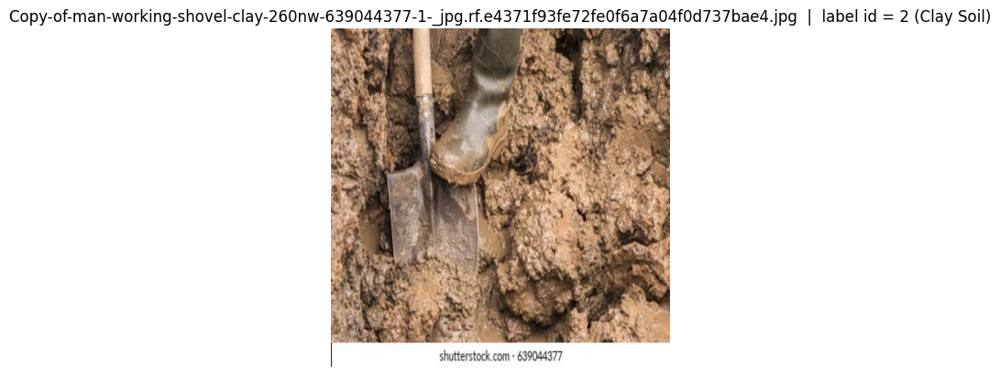

In [ ]:
from pathlib import Path
import yaml
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# ---------------- CONFIG ----------------
DATA_DIR = Path("/content/Soil-detection-3")   # <-- change if your path is different
IMG_SIZE = 224                                 # input size for CNN
BATCH_SIZE = 16
NUM_WORKERS = 2

# --------------- READ data.yaml (class names) ---------------
yaml_path = DATA_DIR / "data.yaml"
if yaml_path.exists():
    with open(yaml_path, "r") as f:
        data_cfg = yaml.safe_load(f)
    class_names = data_cfg.get("names", [])
    print("Class names from data.yaml:", class_names)
else:
    class_names = []
    print("WARNING: data.yaml not found, class names unknown.")

# --------------- HELPER: load (image_path, class_id) per split ---------------
def load_split_items(split):
    img_dir = DATA_DIR / split / "images"
    lbl_dir = DATA_DIR / split / "labels"

    img_paths = sorted([p for p in img_dir.iterdir() if p.is_file()])
    items = []

    for img_path in img_paths:
        label_path = lbl_dir / (img_path.stem + ".txt")
        if not label_path.exists():
            # skip images without label
            continue
        text = label_path.read_text().strip()
        if text == "":
            continue
        # Roboflow classification export: file usually contains just "0" or "1"
        # If it's YOLO detection, first token is still the class id, so this still works.
        first_token = text.split()[0]
        try:
            class_id = int(first_token)
        except ValueError:
            # not an integer -> skip problematic file
            print("Could not parse class id in", label_path)
            continue
        items.append((img_path, class_id))

    return items

train_items = load_split_items("train")
val_items   = load_split_items("valid")
test_items  = load_split_items("test")

print(f"Train samples: {len(train_items)}")
print(f"Valid samples: {len(val_items)}")
print(f"Test  samples: {len(test_items)}")

# --------------- TRANSFORMS (preprocessing + augmentation) ---------------

# ImageNet-style normalization (works well for most pretrained CNNs)
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# --------------- DATASET CLASS ---------------

class SoilDataset(Dataset):
    def __init__(self, items, transform=None):
        self.items = items
        self.transform = transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        img_path, class_id = self.items[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, class_id

# --------------- BUILD DATASETS & DATALOADERS ---------------

train_ds = SoilDataset(train_items, transform=train_transform)
val_ds   = SoilDataset(val_items,   transform=eval_transform)
test_ds  = SoilDataset(test_items,  transform=eval_transform)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print("\nDataloaders ready.")
print("train batches:", len(train_loader), "| val batches:", len(val_loader), "| test batches:", len(test_loader))

# --------------- SHOW ONE RANDOM EXAMPLE (to verify) ---------------
if len(train_items) > 0:
    img_path, cls_id = random.choice(train_items)
    img_raw = Image.open(img_path).convert("RGB")

    plt.imshow(img_raw)
    if class_names and 0 <= cls_id < len(class_names):
        title = f"{img_path.name}  |  label id = {cls_id} ({class_names[cls_id]})"
    else:
        title = f"{img_path.name}  |  label id = {cls_id}"
    plt.title(title)
    plt.axis("off")
    plt.show()
else:
    print("No training items found to visualize.")


In [ ]:
yaml_content = """
train: /content/Soil-detection-3/train/images
val: /content/Soil-detection-3/valid/images
test: /content/Soil-detection-3/test/images

nc: 4
names:
  - Alluvial Soil
  - Black Soil
  - Clay Soil
  - Red Soil
"""

with open("/content/Soil-detection-3/data.yaml", "w") as f:
    f.write(yaml_content)

print("✔ data.yaml updated successfully!")

✔ data.yaml updated successfully!


In [ ]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 74.0 MB/s eta 0:00:00


In [ ]:
!yolo detect train \
data=/content/Soil-detection-3/data.yaml \
model=yolov8n.pt \
epochs=120 \
imgsz=640 \
batch=16 \
optimizer=AdamW \
cos_lr=True \
mosaic=1.0 mixup=0.2 \
name=soil_detection_augmented

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/soil_detection_augmented/weights/best.pt")
metrics = model.val()  # evaluate model


precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1255.3±301.8 MB/s, size: 49.4 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 47.1Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0s/it 4.1s
                   all         58         72      0.445      0.584      0.483      0.291
         Alluvial Soil         18         21      0.374      0.571      0.347      0.172
            Black Soil         17         21      0.677       0.81      0.784      0.526
             Clay Soil          9         11      0.221      0.273       0.22       0.11
              Red Soil         15         19      0.506      0.684      0.581      0.354
Speed: 16.9ms preprocess, 7.6ms inference, 0.

In [ ]:
model.train(
    data='/content/Soil-detection-3/data.yaml',
    model='yolov8s.pt',  # Upgrade from Nano to Small
    imgsz=960,           # Higher resolution for better texture
    epochs=300,          # Give it more time to plateau
    batch=-1,            # Auto-adjust batch size for your GPU
    cos_lr=True,         # Smooths out those jagged precision spikes
    lr0=0.001,           # Slightly lower starting rate
    overlap_mask=False   # Helpful if soil samples are separate piles
)

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/Soil-detection-3/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=300, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=False, patience=100, perspective=0.0, plots=Tru

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b758f81eb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")
metrics = model.val()  # evaluate model

precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1884.4±620.3 MB/s, size: 59.9 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 97.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.3s
                   all         58         72      0.554      0.579      0.541      0.324
         Alluvial Soil         18         21      0.369      0.571      0.426      0.228
            Black Soil         17         21      0.876      0.857      0.874      0.561
             Clay Soil          9         11      0.412      0.257      0.241       0.13
              Red Soil         15         19      0.561      0.632      0.623      0.374
Speed: 20.1ms preprocess, 9.7ms inference, 0.

In [ ]:
!yolo detect train \
    data=/content/Soil-detection-3/data.yaml \
    model=yolov8n \
    epochs=50 \
    imgsz=640 \
    batch=16 \
    device=0 \
    name=soil_detection

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Soil-detection-3/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n, momentum=0.937, mosaic=1.0, multi_scale=False, name=soil_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tr

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/soil_detection/weights/best.pt")
metrics = model.val()  # evaluate model


precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2172.3±485.9 MB/s, size: 60.4 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 110.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.1it/s 1.9s
                   all         58         72      0.638      0.503      0.557      0.358
         Alluvial Soil         18         21      0.524      0.476      0.502      0.286
            Black Soil         17         21      0.929       0.81      0.864      0.571
             Clay Soil          9         11      0.526      0.306      0.402      0.279
              Red Soil         15         19      0.571      0.421      0.461      0.296
Speed: 7.8ms preprocess, 7.4ms inference, 0.

In [ ]:
!yolo detect train \
    data=/content/Soil-detection-3/data.yaml \
    model=yolov8s.pt \
    epochs=100 \
    imgsz=640 \
    batch=16 \
    optimizer=AdamW \
    lr0=0.001 \
    device=0 \
    name=soil_detection_s_v2


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Soil-detection-3/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=soil_detection_s_v2, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/soil_detection_s_v2/weights/best.pt")
metrics = model.val()  # evaluate model


precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1389.8±508.3 MB/s, size: 61.3 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 85.1Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.3s
                   all         58         72      0.634      0.612      0.562      0.352
         Alluvial Soil         18         21      0.546      0.667      0.561      0.312
            Black Soil         17         21        0.9      0.853      0.859      0.587
             Clay Soil          9         11      0.623      0.455      0.403      0.249
              Red Soil         15         19      0.469      0.474      0.423      0.261
Speed: 11.9ms preprocess, 10.0ms inference,

In [ ]:
!yolo detect train \
    model=yolov8s.pt \
    data=/content/Soil-detection-3/data.yaml \
    epochs=120 \
    imgsz=640 \
    batch=16 \
    hsv_h=0.02 \
    hsv_s=0.7 \
    hsv_v=0.5 \
    degrees=10 \
    translate=0.1 \
    scale=0.5 \
    fliplr=0.5 \
    mosaic=1.0 \
    device=0 \
    name=soil_balanced_aug

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Soil-detection-3/data.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=120, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.02, hsv_s=0.7, hsv_v=0.5, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=soil_balanced_aug, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plo

In [ ]:
#Build an interactive dashboard with Streamlit or Dash.
#Integrate segmentation, detection, and erosion predictions.

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/soil_balanced_aug/weights/best.pt")
metrics = model.val()  # evaluate model


precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1335.5±648.5 MB/s, size: 64.4 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 15.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.5it/s 2.8s
                   all         58         72      0.704      0.581      0.584      0.361
         Alluvial Soil         18         21      0.556      0.538      0.518      0.256
            Black Soil         17         21      0.842       0.81      0.854      0.558
             Clay Soil          9         11      0.795      0.455      0.468      0.319
              Red Soil         15         19      0.624      0.524      0.495       0.31
Speed: 10.5ms preprocess, 9.8ms inference, 

In [ ]:
!yolo detect train \
    data=/content/Soil-detection-3/data.yaml \
    model=yolov8s.pt \
    epochs=150 \
    imgsz=640 \
    batch=16 \
    optimizer=AdamW \
    lr0=0.001 \
    device=0 \
    name=soil_v8s_150ep


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Soil-detection-3/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=soil_v8s_150ep, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.0, pl

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/soil_v8s_150ep/weights/best.pt")
metrics = model.val()  # evaluate model


precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
map50 = metrics.results_dict['metrics/mAP50(B)']
map5095 = metrics.results_dict['metrics/mAP50-95(B)']

# Calculate simple accuracy
accuracy = (precision + recall) / 2

# Print results
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("mAP50:", round(map50, 4))
print("mAP50-95:", round(map5095, 4))
print("Accuracy:", round(accuracy, 4))
print("Accuracy (%):", round(accuracy * 100, 2), "%")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1714.5±372.4 MB/s, size: 94.7 KB)
val: Scanning /content/Soil-detection-3/valid/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 58/58 98.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.8it/s 2.2s
                   all         58         72      0.721      0.503      0.566      0.376
         Alluvial Soil         18         21       0.56      0.476      0.503      0.308
            Black Soil         17         21      0.822      0.714       0.78      0.538
             Clay Soil          9         11      0.825      0.455      0.496      0.326
              Red Soil         15         19      0.676      0.368      0.482      0.331
Speed: 8.4ms preprocess, 9.7ms inference, 0

In [ ]:
# Run to compute per-object classification report and confusion matrix
from ultralytics import YOLO

from pathlib import Path
from sklearn.metrics import classification_report, confusion_matrix
from PIL import Image
import numpy as np

model = YOLO("/content/runs/detect/soil_balanced_aug/weights/best.pt")
TEST_DIR = Path("/content/Soil-detection-3/test/images")
LABEL_DIR = Path("/content/Soil-detection-3/test/labels")
class_names = ["Alluvial Soil","Black Soil","Clay Soil","Red Soil"]

def read_gt(path):
    out=[]
    for ln in path.read_text().strip().splitlines():
        toks=ln.split()
        if len(toks)>=5:
            out.append((int(toks[0]), float(toks[1]), float(toks[2]), float(toks[3]), float(toks[4])))
    return out

def xywh_to_xyxy(box, w, h):
    x,y,ww,hh=box
    x1=(x-ww/2)*w; y1=(y-hh/2)*h; x2=(x+ww/2)*w; y2=(y+hh/2)*h
    return [x1,y1,x2,y2]

def iou(a,b):
    xA=max(a[0],b[0]); yA=max(a[1],b[1]); xB=min(a[2],b[2]); yB=min(a[3],b[3])
    inter=max(0,xB-xA)*max(0,yB-yA)
    areaA=max(0,a[2]-a[0])*max(0,a[3]-a[1])
    areaB=max(0,b[2]-b[0])*max(0,b[3]-b[1])
    return inter / (areaA+areaB-inter) if (areaA+areaB-inter)>0 else 0

y_true=[]; y_pred=[]
for img_path in sorted(TEST_DIR.glob("*.*")):
    img_w,img_h = Image.open(img_path).size
    gts = read_gt(LABEL_DIR/(img_path.stem + ".txt")) if (LABEL_DIR/(img_path.stem + ".txt")).exists() else []
    det = model(str(img_path), imgsz=640)[0]
    preds=[]
    if hasattr(det, "boxes") and len(det.boxes):
        for b in det.boxes:
            preds.append((int(b.cls.cpu().numpy()[0]), b.xyxy.cpu().numpy()[0].tolist(), float(b.conf.cpu().numpy()[0])))
    gt_boxes = [(c, xywh_to_xyxy((x,y,w,h), img_w, img_h)) for (c,x,y,w,h) in gts]
    # match GT -> best pred
    for gt_cls, gt_xy in gt_boxes:
        best_iou=0; best_cls=None; best_idx=None
        for i,(pcls, pxy, conf) in enumerate(preds):
            val=iou(gt_xy, pxy)
            if val>best_iou:
                best_iou=val; best_cls=pcls; best_idx=i
        if best_iou>=0.5:
            y_true.append(gt_cls); y_pred.append(best_cls)
            preds.pop(best_idx)
        else:
            y_true.append(gt_cls); y_pred.append(-1)   # missed
# Filter matched (ignore missed or treat missed as background)
mask = np.array(y_pred) != -1
if mask.sum()>0:
    print(classification_report(np.array(y_true)[mask], np.array(y_pred)[mask], target_names=class_names, zero_division=0))
    print("Confusion matrix:\n", confusion_matrix(np.array(y_true)[mask], np.array(y_pred)[mask]))
else:
    print("No matched predictions found. Consider lowering IoU threshold.")



image 1/1 /content/Soil-detection-3/test/images/Black_38_jpg.rf.cce2afe5e739cb1d77fbdfd7d51d5012.jpg: 640x640 1 Alluvial Soil, 1 Black Soil, 42.0ms
Speed: 17.2ms preprocess, 42.0ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Soil-detection-3/test/images/Black_44_jpg.rf.bfb078e5b0304edb36b2cc1d57ea3cbc.jpg: 640x640 1 Black Soil, 38.0ms
Speed: 6.0ms preprocess, 38.0ms inference, 9.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Soil-detection-3/test/images/Black_47_jpg.rf.30fa0ac078480d4fbb2bdb6bd4c189c3.jpg: 640x640 1 Black Soil, 25.7ms
Speed: 5.5ms preprocess, 25.7ms inference, 7.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Soil-detection-3/test/images/Clay_47_jpg.rf.75ea8b632fb8f5e1a540b31945d9ff4d.jpg: 640x640 1 Clay Soil, 19.9ms
Speed: 6.0ms preprocess, 19.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Soil-detection-3/test/images/Copy-of-clay-soil-c